# Instructions
<hr>

## 1. install YOLO v5

In [1]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...


## 2. install requirements.txt

In [1]:
!pip install -r ./yolov5/requirements.txt

In [1]:
import torch
USE_CUDA = torch.cuda.is_available()
device = torch.device('cuda:0' if USE_CUDA else 'cpu')
print(torch.cuda.is_available())
print(device)

True
cuda:0


In [2]:
import yaml

with open('person.yaml', 'r') as f:
  data = yaml.full_load(f)

print(data)
data['train'] = 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/train/'

data['val'] = 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/val/'

with open('person.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': ['person'], 'nc': 1, 'train': 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/train/', 'val': 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/val/'}
{'names': ['person'], 'nc': 1, 'train': 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/train/', 'val': 'C:/Users/User/Desktop/yolov5_onlyPerson/person/images/val/'}


In [4]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
os.environ["CUDA_VISIBLE_DEVICES"]= '0'

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print('Device:', device)
print('Current cuda device:', torch.cuda.current_device())
print('Count of using GPUs:', torch.cuda.device_count())

Device: cuda
Current cuda device: 0
Count of using GPUs: 1


# **2.Model Training**
* data : About data yaml file directory
* weights : Pre-Trained Model file directory (.pt), If you enter nothing model training with random weight value
* epochs : epoch 
* batch : batch_size
* cfg: example
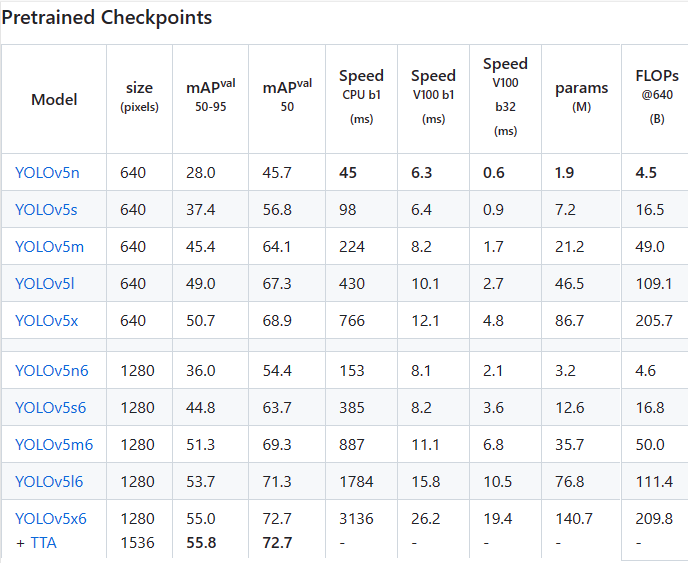

In [8]:
# epochs 100
!python ./yolov5/train.py --batch 16 --epochs 100 --data person.yaml --cfg ./yolov5/models/yolov5s.yaml --weights yolov5s.pt --name results_person

train: weights=yolov5s.pt, cfg=./yolov5/models/yolov5s.yaml, data=person.yaml, hyp=yolov5\data\hyps\hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5\runs\train, name=results_person, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-215-ga6659d0 Python-3.10.11 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, an

The trained model is saved in the directory specified by --name in the format ./yolov5/runs/. In this exercise, it is saved in the directory ./yolov5/runs/train/piano_yolov5s_results/. You can visualize the training results by accessing the results.png file in that path.

### Viewing training results with TensorBoard

In [6]:
%reload_ext tensorboard

In [8]:
%load_ext tensorboard
%tensorboard --logdir ./yolov5/runs/train/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with -4).

# 3. **Model Validation**

The trained model weights are saved in /content/yolov5/runs/train/hijab_yolov5s_results/weights/best.pt, and they are used to validate the model.

In [10]:
!python ./yolov5/val.py --data ./person.yaml --weights ./yolov5/runs/train/results_person/weights/best.pt

val: data=./person.yaml, weights=['./yolov5/runs/train/results_person/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-215-ga6659d0 Python-3.10.11 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

val: Scanning C:\Users\User\Desktop\yolov5_onlyPerson\person\labels\val.cache... 162 images, 0 backgrounds, 0 corrupt: 100%|##########| 162/162 [00:00<?, ?it/s]
val: Scanning C:\Users\User\Desktop\yolov5_onlyPerson\person\labels\val.cache... 162 images, 0 backgrounds, 0 corrupt: 100%|##########| 162/162 [00:00<?, ?it/s]

                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0%|          |

The validation results are saved in /runs/val/exp/.

# 4. **Model Prediction**
* source : Test Image (or Folder) Directory
* weights : The path to the weight file (in .pt format) after training is complete.
* conf : conf_threshold value (0 ~ 1)


To draw bounding boxes, the class score should exceed the specified value. The results are saved in the runs/detect/exp directory. If you repeat the predictions, folders such as exp1, exp2, exp3, etc., will be created in the runs/detect directory, and the results will be recorded in those folders.

In [11]:
from glob import glob
test_img_list = glob('./person/images/test/**/*.jpg', recursive=True)
print("length:", len(test_img_list))
print(test_img_list)

length: 162
['./person/images/test\\person_100.jpg', './person/images/test\\person_105.jpg', './person/images/test\\person_108.jpg', './person/images/test\\person_12.jpg', './person/images/test\\person_125.jpg', './person/images/test\\person_126.jpg', './person/images/test\\person_127.jpg', './person/images/test\\person_129.jpg', './person/images/test\\person_134.jpg', './person/images/test\\person_143.jpg', './person/images/test\\person_148.jpg', './person/images/test\\person_156.jpg', './person/images/test\\person_158.jpg', './person/images/test\\person_159.jpg', './person/images/test\\person_16.jpg', './person/images/test\\person_164.jpg', './person/images/test\\person_168.jpg', './person/images/test\\person_169.jpg', './person/images/test\\person_17.jpg', './person/images/test\\person_172.jpg', './person/images/test\\person_175.jpg', './person/images/test\\person_177.jpg', './person/images/test\\person_186.jpg', './person/images/test\\person_187.jpg', './person/images/test\\person_

In [17]:
import os
from IPython.display import Image

In [18]:
!python ./yolov5/detect.py --weights ./yolov5/runs/train/results_person/weights/best.pt --source "./person/images/test/"

detect: weights=['./yolov5/runs/train/results_person/weights/best.pt'], source=./person/images/test/, data=yolov5\data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5\runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-215-ga6659d0 Python-3.10.11 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/162 C:\Users\User\Desktop\yolov5_onlyPerson\person\images\test\person_100.jpg: 640x384 1 person, 50.0ms
image 2/162 C:\Users\User\Desktop\yolov5_onlyPerson\person\images\test\person_105.jpg: 640x384 1 person, 4.0ms
image 3/162 C:\Users\User\Desktop\yolov5_onlyPerson\person\im

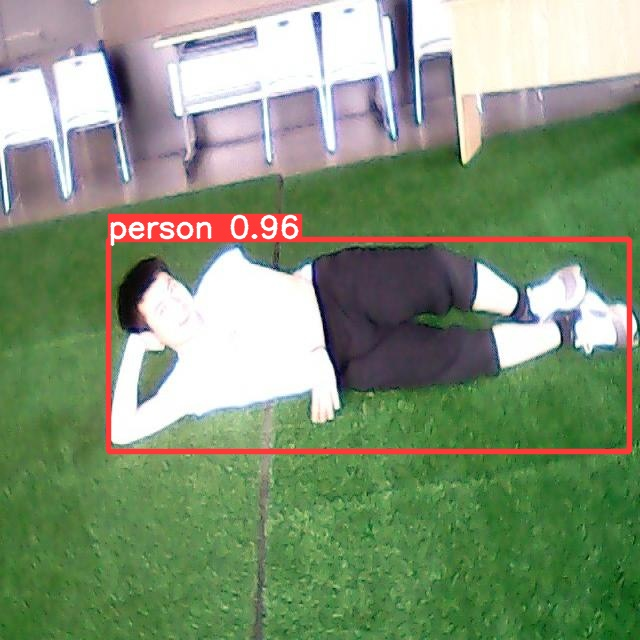

In [20]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp/person_671.jpg')

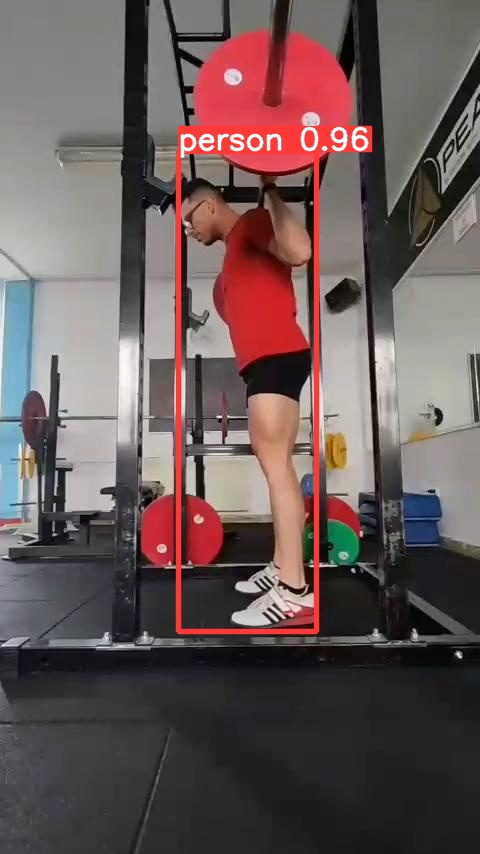

In [21]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp/person_12.jpg')

In [22]:
!python ./yolov5/detect.py --weights ./yolov5/runs/train/results_person/weights/best.pt --source "./person/images/test_yeongmin/"

detect: weights=['./yolov5/runs/train/results_person/weights/best.pt'], source=./person/images/test_yeongmin/, data=yolov5\data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5\runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-215-ga6659d0 Python-3.10.11 torch-2.0.1 CUDA:0 (NVIDIA GeForce RTX 4080, 16376MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/5 C:\Users\User\Desktop\yolov5_onlyPerson\person\images\test_yeongmin\yeongmin1.png: 640x320 1 person, 51.6ms
image 2/5 C:\Users\User\Desktop\yolov5_onlyPerson\person\images\test_yeongmin\yeongmin2.png: 640x320 1 person, 4.0ms
image 3/5 C:\Users\User\Desktop\yolov5_o

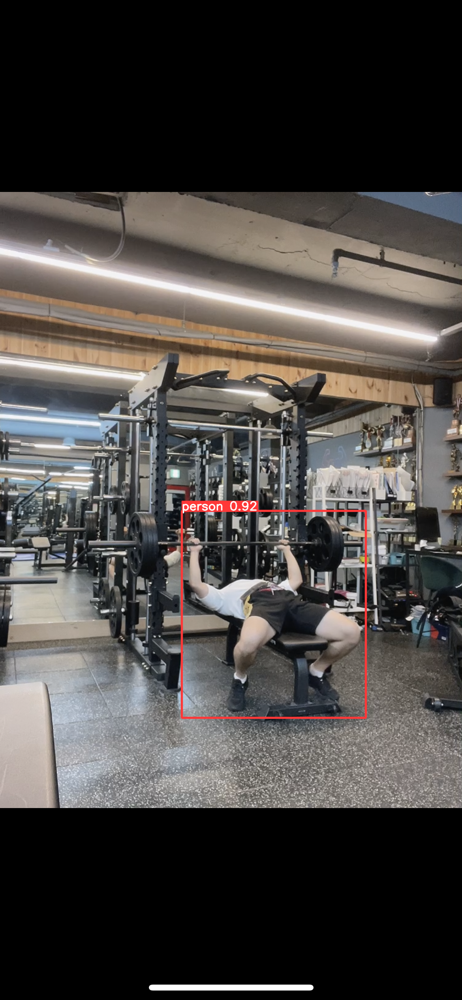

In [26]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp2/yeongmin1.png')

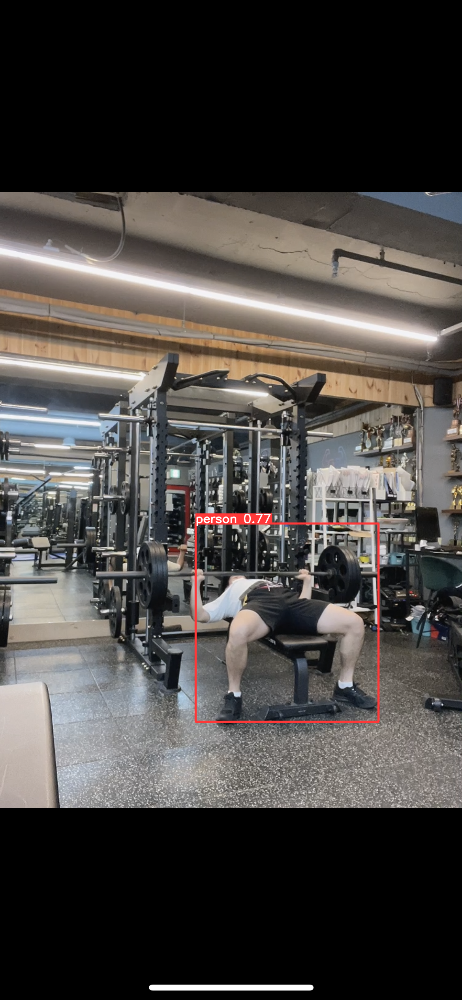

In [27]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp2/yeongmin2.png')

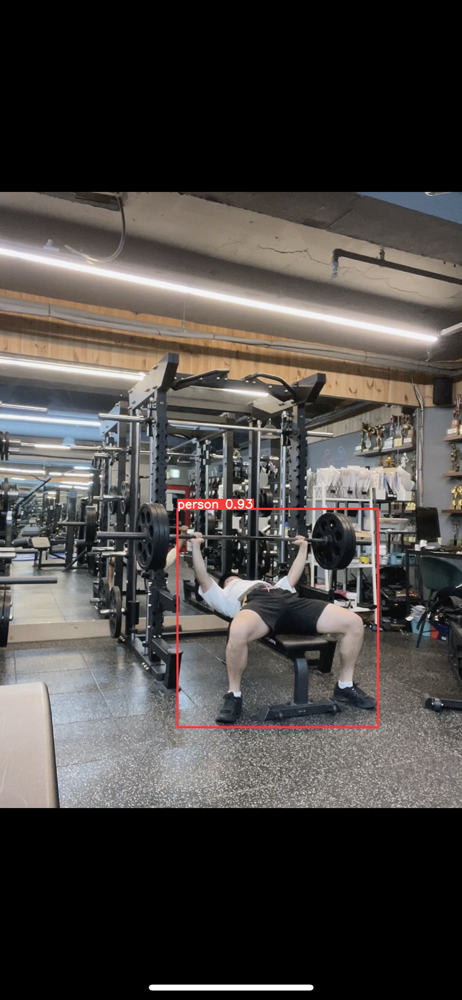

In [28]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp2/yeongmin3.png')

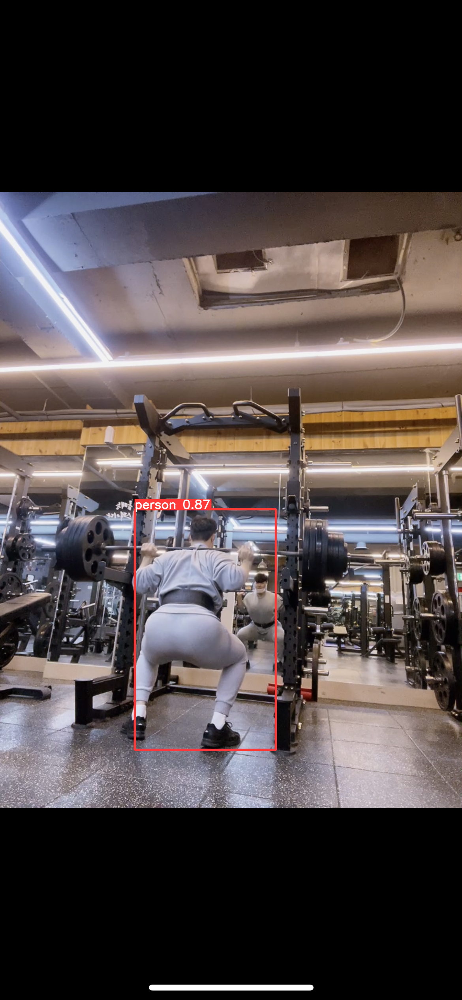

In [29]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp2/yeongmin4.png')

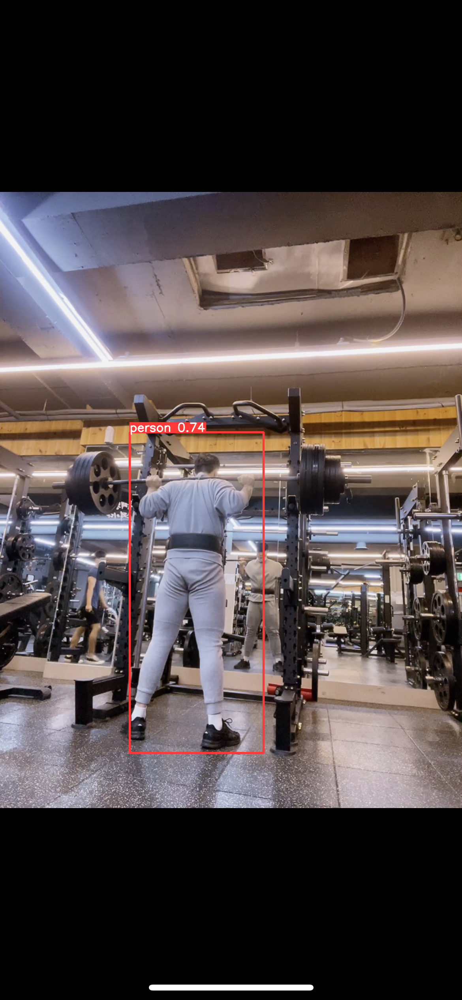

In [30]:
Image('C:/Users/User/Desktop/yolov5_onlyPerson/yolov5/runs/detect/exp2/yeongmin5.png')